# TRANSFORMER

In [1]:
import torch
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
from tqdm import tqdm
import torch.nn as nn
from torch.utils.data import Dataset
from torch.utils.data import DataLoader
import torchvision.transforms.functional as TF
import os
import math
import random
import pyarrow.parquet as pq
import copy

In [2]:
device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')
print('Using device:', device)


Using device: cuda


In [3]:
def is_parquet_file(filename):
    return (filename[0].endswith(".parquet"))

class LandmarkDataset(Dataset):
    def __init__(self, data, labels):
        
        
        self.labels = torch.LongTensor(labels).to(device)
        self.landmark_filenames = ['/kaggle/input/iasl-dataset/'+x[0] for x in data if is_parquet_file(x)]
        self.data = [torch.FloatTensor(pd.read_parquet(path).values).to(device) for path in tqdm(self.landmark_filenames,desc='Loading data', total=len(self.landmark_filenames))]

    def __len__(self):
        return len(self.data)

    def __getitem__(self, idx):
        
        
        return self.data[idx], self.labels[idx]

In [4]:
data = pd.read_csv("/kaggle/input/final-train/final_train.csv")
data = data.drop(["Unnamed: 0"], axis = 1)

In [5]:
X = data["path"].values
X = X.reshape(-1,1)
X

array([['dataset4/asl-signs/train_landmark_files/26734/1000035562.parquet'],
       ['dataset4/asl-signs/train_landmark_files/28656/1000106739.parquet'],
       ['dataset4/asl-signs/train_landmark_files/16069/100015657.parquet'],
       ...,
       ['dataset4/asl-signs/train_landmark_files/25571/999833418.parquet'],
       ['dataset4/asl-signs/train_landmark_files/29302/999895257.parquet'],
       ['dataset4/asl-signs/train_landmark_files/36257/999962374.parquet']],
      dtype=object)

In [6]:
Y = data["label"].values
#Y = Y.reshape(-1,1)
Y

array([ 25, 232,  48, ...,  86, 188, 105])

In [7]:
from sklearn.model_selection import train_test_split
X_train, X_test, y_train, y_test = train_test_split(X, Y, test_size=0.1, random_state=42)

In [8]:
print("X shape: ",X.shape)
print("Y shape: ",Y.shape)
print("X_train shape: ",X_train.shape)
print("y_train shape: ",y_train.shape)
print("X_test shape: ",X_test.shape)
print("y_test shape: ",y_test.shape)

X shape:  (94477, 1)
Y shape:  (94477,)
X_train shape:  (85029, 1)
y_train shape:  (85029,)
X_test shape:  (9448, 1)
y_test shape:  (9448,)


In [9]:
train_dataset = LandmarkDataset(X_train, y_train)
val_dataset = LandmarkDataset(X_test, y_test)

Loading data: 100%|██████████| 9448/9448 [05:19<00:00, 29.57it/s]


In [12]:
train_loader = DataLoader(dataset=train_dataset, batch_size=128, shuffle=True)#, num_workers=8, drop_last=False, pin_memory=True)
val_loader = DataLoader(dataset=val_dataset, batch_size=128, shuffle=False)#, num_workers=8, drop_last=False, pin_memory=True)

In [13]:
class PositionalEncoding(nn.Module):

    def __init__(self, d_model: int, dropout: float = 0.1, max_len: int = 135):
        super().__init__()
        self.dropout = nn.Dropout(p=dropout)

        position = torch.arange(max_len).unsqueeze(1)
        div_term = torch.exp(torch.arange(0, d_model, 2) * (-math.log(10000.0) / d_model))
        pe = torch.zeros(1, max_len, d_model)
        pe[0, :,  0::2] = torch.sin(position * div_term)
        pe[0, :,  1::2] = torch.cos(position * div_term)
        self.register_buffer('pe', pe)

    def forward(self, x: torch.Tensor) -> torch.Tensor:
        x = x + self.pe
        return self.dropout(x).to(device)

In [14]:
class Model(nn.Module):
    def __init__(self,num_embed, d_model, max_len, n_heads, num_encoders, num_classes, dropout, activation, batch_first = True):
        super(Model,self).__init__()
        self.d_model = d_model
        self.max_len = max_len
        self.n_heads = n_heads
        self.num_encoders = num_encoders
        self.dropout = dropout
        self.num_embed = num_embed
        
        self.embed = nn.ModuleList()
        
        self.embed.append(nn.Linear(d_model, d_model*2, bias = True))
        self.embed.append(nn.LayerNorm(d_model*2))
        self.embed.append(torch.nn.ReLU(inplace = True))
        for i in range(num_embed-2):
            self.embed.append(torch.nn.Linear(d_model*2, d_model*2,bias = True))
            self.embed.append(nn.LayerNorm(d_model*2))
            self.embed.append(torch.nn.ReLU(inplace = True))
        self.embed.append(nn.Linear(d_model*2, d_model, bias = True))
        self.embed.append(nn.LayerNorm(d_model))
        self.embed.append(torch.nn.ReLU(inplace = True))
        
        
        self.positionalEncoder = PositionalEncoding(d_model = d_model, max_len = max_len)
        self.cls_embedding = nn.Parameter(torch.zeros((1, d_model)))
        self.encoderLayer = nn.TransformerEncoderLayer(d_model = self.d_model, 
                                                       nhead = self.n_heads, 
                                                       dim_feedforward=self.d_model*2, 
                                                      dropout = self.dropout, 
                                                      activation = activation, 
                                                      batch_first = batch_first)
        self.Encoder = nn.TransformerEncoder(encoder_layer = self.encoderLayer, num_layers = self.num_encoders)
        self.output = nn.Linear(self.d_model, num_classes)
        
        
    def forward(self, x):
        for layer in self.embed:
            x = layer(x)
        
        x = self.positionalEncoder(x)
        x = x + self.cls_embedding
        x = self.Encoder(x)
        x = x[:, -1, :]
        x = self.output(x)
        
        return x
        
        

In [28]:
!pip install optuna

# HyperParamater Tuning

In [15]:
import optuna
from optuna.pruners import MedianPruner

def train(params,save_model, trial):
    learning_rate = 5e-4
    weight_decay = 1e-1
    cycle = 8
    model = Model(num_embed = params["num_embed_layers"], d_model=176, max_len=135, n_heads=params["n_heads"], num_encoders=params["n_encoder_layers"], num_classes=250, 
              dropout=params["dropout"], activation='relu', batch_first=True).to(device)
    loss_fn = nn.CrossEntropyLoss()
    optimizer = torch.optim.AdamW(model.parameters(), lr=learning_rate, weight_decay=weight_decay)
    scheduler = torch.optim.lr_scheduler.CosineAnnealingWarmRestarts(optimizer, T_0=cycle, eta_min=learning_rate / 10)
    best_loss = float('inf')
    saved_state = model.state_dict()

    epochs = 10
    for epoch in range(epochs):
        acc, loss, v_acc, v_loss = 0,0,0,0
        
        total_batches = len(train_loader)
        train_size, train_batches = 0, 0
        train_loss, train_correct = 0, 0
        val_size, val_batches = 0, 0
        val_loss, val_correct = 0, 0
        n_offset=1

        with tqdm(desc=f'Epoch {epoch+n_offset}', total=total_batches) as bar:

            # Training
            for batch, (src, y) in enumerate(train_loader):

                # Compute prediction and loss
                pred = model(src)
                loss = loss_fn(pred, y)

                # Compute metrics
                train_loss += loss.item()
                train_correct += (pred.argmax(1) == y).type(torch.float).sum().item()
                train_size += len(y)
                train_batches += 1

                # Backpropagation
                optimizer.zero_grad()
                loss.backward()
                torch.nn.utils.clip_grad_norm_(model.parameters(), 0.5)
                optimizer.step()

                scheduler.step(epoch + batch / total_batches)

                # Update progress bar
                bar.update()
                bar.set_postfix(accuracy = train_correct / train_size, loss = train_loss / train_batches,
                               lr=scheduler.get_last_lr())

            bar.set_postfix(accuracy = train_correct / train_size, loss = train_loss / train_batches)
            #scheduler.step()

            # Validation
            with torch.no_grad():

                for batch, (src, y) in enumerate(val_loader):

                    # Compute prediction and loss
                    pred = model(src)
                    val_loss += loss_fn(pred, y).item()

                    # Compute metrics
                    val_correct += (pred.argmax(1) == y).type(torch.float).sum().item()
                    val_size += len(y)
                    val_batches += 1

                    # Update progress bar
                    bar.set_postfix(
                        accuracy = train_correct / train_size, loss = train_loss / train_batches,
                        val_accuracy = val_correct / val_size, val_loss = val_loss / val_batches
                    )
                    
            

        if scheduler.T_0 - scheduler.T_cur < 0.1:
            print()
        acc = train_correct / train_size
        loss = train_loss / train_batches
        v_acc = val_correct / val_size
        v_loss = val_loss / val_batches
        
        
        if v_loss<best_loss:
            best_loss = v_loss
            if save_model:
                saved_state = model.state_dict()
        
        if trial.should_prune():
                raise optuna.TrialPruned()
                
        
            
    return best_loss

def objective(trial):
    params = {
        "num_embed_layers" : trial.suggest_int("num_embed_layers", 2, 8),
        "n_heads" : trial.suggest_categorical("n_heads",[2, 4, 8, 11, 16, 22]),
        "n_encoder_layers" : trial.suggest_int("n_encoder_layers", 2, 12),
        "dropout" : trial.suggest_float("dropout", 0.1, 0.7)
    }
    print(trial.params)
    best_val_loss = train(params, False, trial)
    return best_val_loss

study = optuna.create_study(direction = "minimize", pruner=MedianPruner())
study.optimize(objective, n_trials = 20)



    
    

[I 2023-04-25 23:25:50,458] A new study created in memory with name: no-name-8f11ec9d-613b-4a14-a320-27c84bc307f3


{'num_embed_layers': 4, 'n_heads': 8, 'n_encoder_layers': 7, 'dropout': 0.672351787827129}


Epoch 8: 100%|██████████| 665/665 [01:24<00:00,  7.84it/s, accuracy=0.00414, loss=5.52, val_accuracy=0.00402, val_loss=5.52]


Epoch 10: 100%|██████████| 665/665 [01:24<00:00,  7.84it/s, accuracy=0.00409, loss=5.52, val_accuracy=0.0037, val_loss=5.53] 
[I 2023-04-25 23:39:59,854] Trial 0 finished with value: 5.524763725899361 and parameters: {'num_embed_layers': 4, 'n_heads': 8, 'n_encoder_layers': 7, 'dropout': 0.672351787827129}. Best is trial 0 with value: 5.524763725899361.


{'num_embed_layers': 4, 'n_heads': 2, 'n_encoder_layers': 5, 'dropout': 0.6268473572970121}


Epoch 8: 100%|██████████| 665/665 [00:48<00:00, 13.79it/s, accuracy=0.00652, loss=5.49, val_accuracy=0.00646, val_loss=5.5] 


Epoch 10: 100%|██████████| 665/665 [00:48<00:00, 13.79it/s, accuracy=0.00415, loss=5.52, val_accuracy=0.00381, val_loss=5.52]
[I 2023-04-25 23:48:02,145] Trial 1 finished with value: 5.499109551713273 and parameters: {'num_embed_layers': 4, 'n_heads': 2, 'n_encoder_layers': 5, 'dropout': 0.6268473572970121}. Best is trial 1 with value: 5.499109551713273.


{'num_embed_layers': 4, 'n_heads': 4, 'n_encoder_layers': 2, 'dropout': 0.49299440042759235}


Epoch 8: 100%|██████████| 665/665 [00:26<00:00, 25.33it/s, accuracy=0.0771, loss=4.39, val_accuracy=0.0803, val_loss=4.39]


Epoch 10: 100%|██████████| 665/665 [00:26<00:00, 25.39it/s, accuracy=0.103, loss=4.21, val_accuracy=0.121, val_loss=4.04] 
[I 2023-04-25 23:52:23,821] Trial 2 finished with value: 4.038217550999409 and parameters: {'num_embed_layers': 4, 'n_heads': 4, 'n_encoder_layers': 2, 'dropout': 0.49299440042759235}. Best is trial 2 with value: 4.038217550999409.


{'num_embed_layers': 3, 'n_heads': 22, 'n_encoder_layers': 8, 'dropout': 0.6333885385918449}


Epoch 8: 100%|██████████| 665/665 [02:26<00:00,  4.55it/s, accuracy=0.00406, loss=5.52, val_accuracy=0.0037, val_loss=5.53] 


Epoch 10: 100%|██████████| 665/665 [02:26<00:00,  4.55it/s, accuracy=0.0038, loss=5.52, val_accuracy=0.00381, val_loss=5.52]
[I 2023-04-26 00:16:45,348] Trial 3 finished with value: 5.524354354755299 and parameters: {'num_embed_layers': 3, 'n_heads': 22, 'n_encoder_layers': 8, 'dropout': 0.6333885385918449}. Best is trial 2 with value: 4.038217550999409.


{'num_embed_layers': 4, 'n_heads': 11, 'n_encoder_layers': 7, 'dropout': 0.5577553984153759}


Epoch 8: 100%|██████████| 665/665 [01:34<00:00,  7.06it/s, accuracy=0.00556, loss=5.49, val_accuracy=0.0072, val_loss=5.5]  


Epoch 10: 100%|██████████| 665/665 [01:34<00:00,  7.05it/s, accuracy=0.00502, loss=5.51, val_accuracy=0.00423, val_loss=5.51]
[I 2023-04-26 00:32:28,357] Trial 4 finished with value: 5.5007365587595345 and parameters: {'num_embed_layers': 4, 'n_heads': 11, 'n_encoder_layers': 7, 'dropout': 0.5577553984153759}. Best is trial 2 with value: 4.038217550999409.


{'num_embed_layers': 3, 'n_heads': 16, 'n_encoder_layers': 2, 'dropout': 0.5457450589023842}


Epoch 8: 100%|██████████| 665/665 [00:35<00:00, 18.72it/s, accuracy=0.0989, loss=4.27, val_accuracy=0.0985, val_loss=4.25]


Epoch 10: 100%|██████████| 665/665 [00:35<00:00, 18.73it/s, accuracy=0.14, loss=3.94, val_accuracy=0.158, val_loss=3.85]
[I 2023-04-26 00:38:23,526] Trial 5 finished with value: 3.847779641280303 and parameters: {'num_embed_layers': 3, 'n_heads': 16, 'n_encoder_layers': 2, 'dropout': 0.5457450589023842}. Best is trial 5 with value: 3.847779641280303.


{'num_embed_layers': 6, 'n_heads': 16, 'n_encoder_layers': 3, 'dropout': 0.329719019988432}


Epoch 8: 100%|██████████| 665/665 [00:56<00:00, 11.68it/s, accuracy=0.00723, loss=5.48, val_accuracy=0.00519, val_loss=5.5] 


Epoch 10: 100%|██████████| 665/665 [00:56<00:00, 11.68it/s, accuracy=0.00682, loss=5.49, val_accuracy=0.00529, val_loss=5.5] 
[I 2023-04-26 00:47:53,098] Trial 6 finished with value: 5.496161100026724 and parameters: {'num_embed_layers': 6, 'n_heads': 16, 'n_encoder_layers': 3, 'dropout': 0.329719019988432}. Best is trial 5 with value: 3.847779641280303.


{'num_embed_layers': 2, 'n_heads': 8, 'n_encoder_layers': 11, 'dropout': 0.13548301555989475}


Epoch 8: 100%|██████████| 665/665 [02:05<00:00,  5.31it/s, accuracy=0.00427, loss=5.52, val_accuracy=0.00381, val_loss=5.52]


Epoch 10: 100%|██████████| 665/665 [02:05<00:00,  5.31it/s, accuracy=0.00387, loss=5.52, val_accuracy=0.00275, val_loss=5.52] 
[I 2023-04-26 01:08:44,776] Trial 7 finished with value: 5.5236259924398885 and parameters: {'num_embed_layers': 2, 'n_heads': 8, 'n_encoder_layers': 11, 'dropout': 0.13548301555989475}. Best is trial 5 with value: 3.847779641280303.


{'num_embed_layers': 3, 'n_heads': 22, 'n_encoder_layers': 6, 'dropout': 0.21450403120480893}


Epoch 8: 100%|██████████| 665/665 [01:49<00:00,  6.06it/s, accuracy=0.0594, loss=4.56, val_accuracy=0.0627, val_loss=4.54]


Epoch 10: 100%|██████████| 665/665 [01:49<00:00,  6.06it/s, accuracy=0.0791, loss=4.37, val_accuracy=0.0708, val_loss=4.45]
[I 2023-04-26 01:27:02,355] Trial 8 finished with value: 4.44695816168914 and parameters: {'num_embed_layers': 3, 'n_heads': 22, 'n_encoder_layers': 6, 'dropout': 0.21450403120480893}. Best is trial 5 with value: 3.847779641280303.


{'num_embed_layers': 7, 'n_heads': 22, 'n_encoder_layers': 5, 'dropout': 0.5476428935808001}


Epoch 8: 100%|██████████| 665/665 [01:41<00:00,  6.54it/s, accuracy=0.00632, loss=5.49, val_accuracy=0.00667, val_loss=5.5] 


Epoch 10: 100%|██████████| 665/665 [01:41<00:00,  6.54it/s, accuracy=0.00596, loss=5.5, val_accuracy=0.00603, val_loss=5.5] 
[I 2023-04-26 01:43:58,844] Trial 9 finished with value: 5.499253247235273 and parameters: {'num_embed_layers': 7, 'n_heads': 22, 'n_encoder_layers': 5, 'dropout': 0.5476428935808001}. Best is trial 5 with value: 3.847779641280303.


{'num_embed_layers': 8, 'n_heads': 16, 'n_encoder_layers': 10, 'dropout': 0.4114152939115715}


Epoch 8: 100%|██████████| 665/665 [02:47<00:00,  3.97it/s, accuracy=0.0043, loss=5.52, val_accuracy=0.00318, val_loss=5.52]


Epoch 10: 100%|██████████| 665/665 [02:48<00:00,  3.96it/s, accuracy=0.00374, loss=5.52, val_accuracy=0.00455, val_loss=5.53]
[I 2023-04-26 02:11:55,151] Trial 10 finished with value: 5.523700011743082 and parameters: {'num_embed_layers': 8, 'n_heads': 16, 'n_encoder_layers': 10, 'dropout': 0.4114152939115715}. Best is trial 5 with value: 3.847779641280303.


{'num_embed_layers': 5, 'n_heads': 4, 'n_encoder_layers': 2, 'dropout': 0.4770636538203089}


Epoch 8: 100%|██████████| 665/665 [00:28<00:00, 23.29it/s, accuracy=0.0251, loss=4.97, val_accuracy=0.0291, val_loss=4.93]


Epoch 10: 100%|██████████| 665/665 [00:28<00:00, 23.36it/s, accuracy=0.0496, loss=4.66, val_accuracy=0.0587, val_loss=4.56]
[I 2023-04-26 02:16:40,643] Trial 11 finished with value: 4.561592172931981 and parameters: {'num_embed_layers': 5, 'n_heads': 4, 'n_encoder_layers': 2, 'dropout': 0.4770636538203089}. Best is trial 5 with value: 3.847779641280303.


{'num_embed_layers': 2, 'n_heads': 4, 'n_encoder_layers': 3, 'dropout': 0.4731116743758287}


Epoch 8: 100%|██████████| 665/665 [00:30<00:00, 21.86it/s, accuracy=0.107, loss=4.19, val_accuracy=0.11, val_loss=4.19] 


Epoch 10: 100%|██████████| 665/665 [00:30<00:00, 21.88it/s, accuracy=0.158, loss=3.84, val_accuracy=0.169, val_loss=3.75]
[I 2023-04-26 02:21:44,652] Trial 12 finished with value: 3.7463306285239555 and parameters: {'num_embed_layers': 2, 'n_heads': 4, 'n_encoder_layers': 3, 'dropout': 0.4731116743758287}. Best is trial 12 with value: 3.7463306285239555.


{'num_embed_layers': 2, 'n_heads': 16, 'n_encoder_layers': 4, 'dropout': 0.3739429095386273}


Epoch 8: 100%|██████████| 665/665 [01:02<00:00, 10.64it/s, accuracy=0.162, loss=3.87, val_accuracy=0.16, val_loss=3.85]  


Epoch 10: 100%|██████████| 665/665 [01:02<00:00, 10.65it/s, accuracy=0.195, loss=3.61, val_accuracy=0.174, val_loss=3.66]
[I 2023-04-26 02:32:09,551] Trial 13 finished with value: 3.6571062738830977 and parameters: {'num_embed_layers': 2, 'n_heads': 16, 'n_encoder_layers': 4, 'dropout': 0.3739429095386273}. Best is trial 13 with value: 3.6571062738830977.


{'num_embed_layers': 2, 'n_heads': 4, 'n_encoder_layers': 4, 'dropout': 0.32648607482015135}


Epoch 8: 100%|██████████| 665/665 [00:39<00:00, 16.96it/s, accuracy=0.169, loss=3.83, val_accuracy=0.175, val_loss=3.81]


Epoch 10: 100%|██████████| 665/665 [00:39<00:00, 16.96it/s, accuracy=0.195, loss=3.59, val_accuracy=0.196, val_loss=3.57]
[I 2023-04-26 02:38:41,771] Trial 14 finished with value: 3.5732288328376978 and parameters: {'num_embed_layers': 2, 'n_heads': 4, 'n_encoder_layers': 4, 'dropout': 0.32648607482015135}. Best is trial 14 with value: 3.5732288328376978.


{'num_embed_layers': 2, 'n_heads': 11, 'n_encoder_layers': 4, 'dropout': 0.31891239569219343}


Epoch 8: 100%|██████████| 665/665 [00:52<00:00, 12.76it/s, accuracy=0.123, loss=4.11, val_accuracy=0.125, val_loss=4.1] 


Epoch 10: 100%|██████████| 665/665 [00:52<00:00, 12.76it/s, accuracy=0.175, loss=3.72, val_accuracy=0.205, val_loss=3.53]
[I 2023-04-26 02:47:23,182] Trial 15 finished with value: 3.5336800104862935 and parameters: {'num_embed_layers': 2, 'n_heads': 11, 'n_encoder_layers': 4, 'dropout': 0.31891239569219343}. Best is trial 15 with value: 3.5336800104862935.


{'num_embed_layers': 2, 'n_heads': 11, 'n_encoder_layers': 9, 'dropout': 0.2602968145904411}


Epoch 8: 100%|██████████| 665/665 [01:54<00:00,  5.79it/s, accuracy=0.00403, loss=5.52, val_accuracy=0.00455, val_loss=5.52]


Epoch 10: 100%|██████████| 665/665 [01:54<00:00,  5.79it/s, accuracy=0.00393, loss=5.52, val_accuracy=0.0036, val_loss=5.52] 
[I 2023-04-26 03:06:29,024] Trial 16 finished with value: 5.523909923192617 and parameters: {'num_embed_layers': 2, 'n_heads': 11, 'n_encoder_layers': 9, 'dropout': 0.2602968145904411}. Best is trial 15 with value: 3.5336800104862935.


{'num_embed_layers': 5, 'n_heads': 11, 'n_encoder_layers': 5, 'dropout': 0.30511056257400576}


Epoch 8: 100%|██████████| 665/665 [01:10<00:00,  9.38it/s, accuracy=0.0073, loss=5.48, val_accuracy=0.0055, val_loss=5.5]  


Epoch 10: 100%|██████████| 665/665 [01:10<00:00,  9.38it/s, accuracy=0.00608, loss=5.49, val_accuracy=0.00688, val_loss=5.5] 
[I 2023-04-26 03:18:18,133] Trial 17 finished with value: 5.496774802336821 and parameters: {'num_embed_layers': 5, 'n_heads': 11, 'n_encoder_layers': 5, 'dropout': 0.30511056257400576}. Best is trial 15 with value: 3.5336800104862935.


{'num_embed_layers': 3, 'n_heads': 2, 'n_encoder_layers': 4, 'dropout': 0.2157503371009148}


Epoch 8: 100%|██████████| 665/665 [00:38<00:00, 17.48it/s, accuracy=0.0978, loss=4.25, val_accuracy=0.0971, val_loss=4.24]


Epoch 10: 100%|██████████| 665/665 [00:38<00:00, 17.50it/s, accuracy=0.126, loss=4.05, val_accuracy=0.154, val_loss=3.87]
[I 2023-04-26 03:24:38,335] Trial 18 finished with value: 3.86891660174808 and parameters: {'num_embed_layers': 3, 'n_heads': 2, 'n_encoder_layers': 4, 'dropout': 0.2157503371009148}. Best is trial 15 with value: 3.5336800104862935.


{'num_embed_layers': 6, 'n_heads': 4, 'n_encoder_layers': 6, 'dropout': 0.37749229058160494}


Epoch 8: 100%|██████████| 665/665 [01:06<00:00, 10.02it/s, accuracy=0.00413, loss=5.52, val_accuracy=0.00349, val_loss=5.52]


Epoch 10: 100%|██████████| 665/665 [01:06<00:00, 10.02it/s, accuracy=0.00425, loss=5.52, val_accuracy=0.00318, val_loss=5.52]
[I 2023-04-26 03:35:42,228] Trial 19 finished with value: 5.5235396591392725 and parameters: {'num_embed_layers': 6, 'n_heads': 4, 'n_encoder_layers': 6, 'dropout': 0.37749229058160494}. Best is trial 15 with value: 3.5336800104862935.


NameError: name 'TrialState' is not defined

In [53]:
from optuna.trial import TrialState

pruned_trials = study.get_trials(deepcopy=False, states=[TrialState.PRUNED])
complete_trials = study.get_trials(deepcopy=False, states=[TrialState.COMPLETE])

print("Study statistics: ")
print("  Number of finished trials: ", len(study.trials))
print("  Number of pruned trials: ", len(pruned_trials))
print("  Number of complete trials: ", len(complete_trials))


print("Best trial:")
trial_ = study.best_trial

print("  Value: ", trial_.value)

print("  Params: ")
for key, value in trial_.params.items():
    print("    {}: {}".format(key, value))


Study statistics: 
  Number of finished trials:  20
  Number of pruned trials:  0
  Number of complete trials:  20
Best trial:
  Value:  3.5336800104862935
  Params: 
    num_embed_layers: 2
    n_heads: 11
    n_encoder_layers: 4
    dropout: 0.31891239569219343


In [19]:
# Visualize the optimization history.
from optuna.visualization import plot_contour
from optuna.visualization import plot_intermediate_values
from optuna.visualization import plot_optimization_history
from optuna.visualization import plot_parallel_coordinate
from optuna.visualization import plot_param_importances
from optuna.visualization import plot_slice
plot_optimization_history(study).show()

In [36]:
# Visualize high-dimensional parameter relationships.
plot_parallel_coordinate(study).show()

In [39]:
plot_parallel_coordinate(study, params=["num_embed_layers", "n_heads"]).show()


In [40]:
plot_parallel_coordinate(study, params=["num_embed_layers", "n_encoder_layers"]).show()


In [41]:
plot_parallel_coordinate(study, params=["num_embed_layers", "dropout"]).show()


In [42]:
plot_parallel_coordinate(study, params=["n_heads", "num_embed_layers"]).show()


In [43]:
plot_parallel_coordinate(study, params=["n_heads", "n_encoder_layers"]).show()


In [44]:
plot_parallel_coordinate(study, params=["n_heads", "dropout"]).show()


In [45]:
plot_parallel_coordinate(study, params=["n_encoder_layers", "num_embed_layers"]).show()


In [46]:
plot_parallel_coordinate(study, params=["n_encoder_layers", "n_heads"]).show()


In [47]:
plot_parallel_coordinate(study, params=["n_encoder_layers", "dropout"]).show()


In [48]:
plot_parallel_coordinate(study, params=["dropout", "num_embed_layers"]).show()


In [49]:
plot_parallel_coordinate(study, params=["dropout", "n_encoder_layers"]).show()


In [50]:
plot_parallel_coordinate(study, params=["dropout", "n_heads"]).show()

In [23]:
# Visualize hyperparameter relationships.
plot_contour(study).show()

In [30]:
# Select parameters to visualize.
plot_contour(study, params=["num_embed_layers", "n_heads"]).show()
plot_contour(study, params=["num_embed_layers", "n_encoder_layers"]).show()
plot_contour(study, params=["num_embed_layers", "dropout"]).show()
plot_contour(study, params=["n_heads", "num_embed_layers"]).show()
plot_contour(study, params=["n_heads", "n_encoder_layers"]).show()
plot_contour(study, params=["n_heads", "dropout"]).show()
plot_contour(study, params=["n_encoder_layers", "num_embed_layers"]).show()
plot_contour(study, params=["n_encoder_layers", "n_heads"]).show()
plot_contour(study, params=["n_encoder_layers", "dropout"]).show()
plot_contour(study, params=["dropout", "num_embed_layers"]).show()
plot_contour(study, params=["dropout", "n_encoder_layers"]).show()
plot_contour(study, params=["dropout", "n_heads"]).show()


In [24]:
# Visualize individual hyperparameters.
plot_slice(study).show()

In [25]:
# Visualize parameter importances.
plot_param_importances(study).show()

Ran another set of trials and got a better loss(3.43) compared to the above, with param values:
1. num_embed = 4
2. n_heads = 4
3. num_encoders = 2
4. dropout = 0.11073790254354612

**Training the model with above param values:**

In [15]:
model = Model(num_embed = 4, d_model=176, max_len=135, n_heads=4, num_encoders=2, num_classes=250, 
              dropout=0.11073790254354612, activation='relu', batch_first=True).to(device)

learning_rate = 5e-4
weight_decay = 1e-1
cycle = 8

loss_fn = nn.CrossEntropyLoss()
optimizer = torch.optim.AdamW(model.parameters(), lr=learning_rate, weight_decay=weight_decay)
scheduler = torch.optim.lr_scheduler.CosineAnnealingWarmRestarts(optimizer, T_0=cycle, eta_min=learning_rate / 10)

train_losses = []
val_losses = []

def train_val_loop(epoch, train_dataloader, val_dataloader, model, loss_fn, optimizer, scheduler, n_offset=1):
    total_batches = len(train_dataloader)
    train_size, train_batches = 0, 0
    train_loss, train_correct = 0, 0
    val_size, val_batches = 0, 0
    val_loss, val_correct = 0, 0
    
    with tqdm(desc=f'Epoch {epoch+n_offset}', total=total_batches) as bar:
        
        # Training
        for batch, (src, y) in enumerate(train_dataloader):
            
            # Compute prediction and loss
            pred = model(src)
            loss = loss_fn(pred, y)
            
            # Compute metrics
            train_loss += loss.item()
            train_correct += (pred.argmax(1) == y).type(torch.float).sum().item()
            train_size += len(y)
            train_batches += 1

            # Backpropagation
            optimizer.zero_grad()
            loss.backward()
            torch.nn.utils.clip_grad_norm_(model.parameters(), 0.5)
            optimizer.step()
                
            scheduler.step(epoch + batch / total_batches)
            
            # Update progress bar
            bar.update()
            bar.set_postfix(accuracy = train_correct / train_size, loss = train_loss / train_batches,
                           lr=scheduler.get_last_lr())
            
        bar.set_postfix(accuracy = train_correct / train_size, loss = train_loss / train_batches)
        
        #scheduler.step()
           
        # Validation
        with torch.no_grad():

            for batch, (src, y) in enumerate(val_dataloader):
                
                # Compute prediction and loss
                pred = model(src)
                val_loss += loss_fn(pred, y).item()
                
                # Compute metrics
                val_correct += (pred.argmax(1) == y).type(torch.float).sum().item()
                val_size += len(y)
                val_batches += 1

                # Update progress bar
                bar.set_postfix(
                    accuracy = train_correct / train_size, loss = train_loss / train_batches,
                    val_accuracy = val_correct / val_size, val_loss = val_loss / val_batches
                )
                
    if scheduler.T_0 - scheduler.T_cur < 0.1:
        print()
        
    train_losses.append(train_loss / train_batches)
    val_losses.append(val_loss / val_batches)

    return train_correct / train_size, train_loss / train_batches, val_correct / val_size, val_loss / val_batches


best_loss = float('inf')
saved_state = model.state_dict()

epochs = 500
for epoch in range(epochs):
    acc, loss, v_acc, v_loss = train_val_loop(epoch, train_loader, val_loader, model, loss_fn, optimizer, scheduler)
    if v_loss<best_loss:
        best_loss = v_loss
        saved_state = model.state_dict()





Epoch 8: 100%|██████████| 665/665 [00:26<00:00, 25.42it/s, accuracy=0.226, loss=3.53, val_accuracy=0.23, val_loss=3.51] 


Epoch 16: 100%|██████████| 665/665 [00:26<00:00, 25.43it/s, accuracy=0.491, loss=2.16, val_accuracy=0.474, val_loss=2.24]


Epoch 24: 100%|██████████| 665/665 [00:26<00:00, 25.44it/s, accuracy=0.586, loss=1.72, val_accuracy=0.553, val_loss=1.87]


Epoch 32: 100%|██████████| 665/665 [00:26<00:00, 25.40it/s, accuracy=0.652, loss=1.44, val_accuracy=0.61, val_loss=1.62] 


Epoch 40: 100%|██████████| 665/665 [00:26<00:00, 25.39it/s, accuracy=0.69, loss=1.29, val_accuracy=0.635, val_loss=1.52]


Epoch 48: 100%|██████████| 665/665 [00:26<00:00, 25.41it/s, accuracy=0.714, loss=1.18, val_accuracy=0.655, val_loss=1.45]


Epoch 56: 100%|██████████| 665/665 [00:26<00:00, 25.35it/s, accuracy=0.735, loss=1.1, val_accuracy=0.663, val_loss=1.41]


Epoch 64: 100%|██████████| 665/665 [00:26<00:00, 25.29it/s, accuracy=0.748, loss=1.04, val_accuracy=0.679, val_loss=1.35]


Epoch 72: 100%|██████████| 665/665 [00:26<00:00, 25.40it/s, accuracy=0.763, loss=0.988, val_accuracy=0.683, val_loss=1.34]


Epoch 80: 100%|██████████| 665/665 [00:26<00:00, 25.34it/s, accuracy=0.771, loss=0.948, val_accuracy=0.69, val_loss=1.3]  


Epoch 88: 100%|██████████| 665/665 [00:26<00:00, 25.36it/s, accuracy=0.779, loss=0.917, val_accuracy=0.693, val_loss=1.29]


Epoch 96: 100%|██████████| 665/665 [00:26<00:00, 25.41it/s, accuracy=0.788, loss=0.884, val_accuracy=0.697, val_loss=1.29]


Epoch 104: 100%|██████████| 665/665 [00:26<00:00, 25.35it/s, accuracy=0.792, loss=0.861, val_accuracy=0.701, val_loss=1.27]


Epoch 112: 100%|██████████| 665/665 [00:26<00:00, 25.38it/s, accuracy=0.8, loss=0.837, val_accuracy=0.701, val_loss=1.28]


Epoch 120: 100%|██████████| 665/665 [00:26<00:00, 25.41it/s, accuracy=0.806, loss=0.814, val_accuracy=0.701, val_loss=1.28]


Epoch 128: 100%|██████████| 665/665 [00:26<00:00, 25.31it/s, accuracy=0.808, loss=0.801, val_accuracy=0.696, val_loss=1.29]


Epoch 136: 100%|██████████| 665/665 [00:26<00:00, 25.45it/s, accuracy=0.813, loss=0.783, val_accuracy=0.706, val_loss=1.27]


Epoch 144: 100%|██████████| 665/665 [00:26<00:00, 25.44it/s, accuracy=0.815, loss=0.774, val_accuracy=0.703, val_loss=1.27]


Epoch 152: 100%|██████████| 665/665 [00:26<00:00, 25.42it/s, accuracy=0.818, loss=0.762, val_accuracy=0.714, val_loss=1.25]


Epoch 160: 100%|██████████| 665/665 [00:26<00:00, 25.42it/s, accuracy=0.822, loss=0.751, val_accuracy=0.704, val_loss=1.29]


Epoch 168: 100%|██████████| 665/665 [00:26<00:00, 25.44it/s, accuracy=0.824, loss=0.741, val_accuracy=0.706, val_loss=1.27]


Epoch 176: 100%|██████████| 665/665 [00:26<00:00, 25.44it/s, accuracy=0.825, loss=0.732, val_accuracy=0.711, val_loss=1.26]


Epoch 184: 100%|██████████| 665/665 [00:26<00:00, 25.43it/s, accuracy=0.829, loss=0.724, val_accuracy=0.7, val_loss=1.28]  


Epoch 192: 100%|██████████| 665/665 [00:26<00:00, 25.44it/s, accuracy=0.831, loss=0.713, val_accuracy=0.709, val_loss=1.26]


Epoch 200: 100%|██████████| 665/665 [00:26<00:00, 25.43it/s, accuracy=0.832, loss=0.707, val_accuracy=0.711, val_loss=1.26]


Epoch 208:  53%|█████▎    | 354/665 [00:13<00:11, 26.53it/s, accuracy=0.834, loss=0.699, lr=[5.3808108424881666e-05]]IOPub message rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_msg_rate_limit`.

Current values:
NotebookApp.iopub_msg_rate_limit=1000.0 (msgs/sec)
NotebookApp.rate_limit_window=3.0 (secs)

Epoch 214:  86%|████████▌ | 573/665 [00:21<00:03, 26.53it/s, accuracy=0.79, loss=0.843, lr=[0.000124972974042531]]   IOPub message rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_msg_rate_limit`.

Current values:
NotebookApp.iopub_msg_rate_limit=1000.0 (msgs/sec)
NotebookApp.rate_limit_window=3.0 (secs)

Epoch 220:  74%|███████▎  | 489/665 [00:18<00:06, 26.55it/s, accuracy=0.731, loss=1.05, lr=[0.00029847485703155387]]

Epoch 226: 100%|██████████| 665/665 [00:25<00:00, 26.56it/s, accuracy=0.692, loss=1.19, val_accuracy=0.635, val_loss=1.54]IOPub message rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_msg_rate_limit`.

Current values:
NotebookApp.iopub_msg_rate_limit=1000.0 (msgs/sec)
NotebookApp.rate_limit_window=3.0 (secs)

Epoch 232: 100%|██████████| 665/665 [00:26<00:00, 25.40it/s, accuracy=0.838, loss=0.684, val_accuracy=0.711, val_loss=1.26]


Epoch 236:  84%|████████▍ | 561/665 [00:21<00:03, 26.52it/s, accuracy=0.736, loss=1.03, lr=[0.0002889422137914342]] IOPub message rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_msg_rate_limit`.

Current values:
NotebookApp.iopub_msg_rate_limit=1000.0 (msgs/sec)
NotebookApp.rate_limit_window=3.0 (secs)

Epoch 240: 100%|██████████| 665/665 [00:26<00:00, 25.41it/s, accuracy=0.84, loss=0.678, val_accuracy=0.718, val_loss=1.25]


Epoch 245:  89%|████████▉ | 592/665 [00:22<00:02, 26.53it/s, accuracy=0.765, loss=0.933, lr=[0.00019805934071545877]]IOPub message rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_msg_rate_limit`.

Current values:
NotebookApp.iopub_msg_rate_limit=1000.0 (msgs/sec)
NotebookApp.rate_limit_window=3.0 (secs)

Epoch 248: 100%|██████████| 665/665 [00:26<00:00, 25.41it/s, accuracy=0.841, loss=0.674, val_accuracy=0.718, val_loss=1.22]


Epoch 256: 100%|██████████| 665/665 [00:26<00:00, 25.26it/s, accuracy=0.842, loss=0.672, val_accuracy=0.714, val_loss=1.26]


Epoch 264: 100%|██████████| 665/665 [00:26<00:00, 25.41it/s, accuracy=0.844, loss=0.66, val_accuracy=0.709, val_loss=1.26]


Epoch 272: 100%|██████████| 665/665 [00:26<00:00, 25.43it/s, accuracy=0.843, loss=0.662, val_accuracy=0.714, val_loss=1.25]


Epoch 280: 100%|██████████| 665/665 [00:26<00:00, 25.45it/s, accuracy=0.845, loss=0.655, val_accuracy=0.713, val_loss=1.25]


Epoch 288: 100%|██████████| 665/665 [00:26<00:00, 25.41it/s, accuracy=0.846, loss=0.651, val_accuracy=0.718, val_loss=1.25]


Epoch 296: 100%|██████████| 665/665 [00:26<00:00, 25.40it/s, accuracy=0.847, loss=0.646, val_accuracy=0.719, val_loss=1.23]


Epoch 304: 100%|██████████| 665/665 [00:26<00:00, 25.35it/s, accuracy=0.849, loss=0.64, val_accuracy=0.713, val_loss=1.26]


Epoch 312: 100%|██████████| 665/665 [00:26<00:00, 25.37it/s, accuracy=0.851, loss=0.638, val_accuracy=0.719, val_loss=1.25]


Epoch 320: 100%|██████████| 665/665 [00:26<00:00, 25.41it/s, accuracy=0.852, loss=0.635, val_accuracy=0.706, val_loss=1.28]


Epoch 328: 100%|██████████| 665/665 [00:26<00:00, 25.41it/s, accuracy=0.851, loss=0.632, val_accuracy=0.718, val_loss=1.25]


Epoch 336: 100%|██████████| 665/665 [00:26<00:00, 25.43it/s, accuracy=0.853, loss=0.627, val_accuracy=0.715, val_loss=1.25]


Epoch 344: 100%|██████████| 665/665 [00:26<00:00, 25.40it/s, accuracy=0.854, loss=0.62, val_accuracy=0.709, val_loss=1.27]


Epoch 352: 100%|██████████| 665/665 [00:26<00:00, 25.44it/s, accuracy=0.853, loss=0.624, val_accuracy=0.72, val_loss=1.24] 


Epoch 360: 100%|██████████| 665/665 [00:26<00:00, 25.43it/s, accuracy=0.855, loss=0.619, val_accuracy=0.716, val_loss=1.26]


Epoch 368: 100%|██████████| 665/665 [00:26<00:00, 25.46it/s, accuracy=0.856, loss=0.616, val_accuracy=0.715, val_loss=1.27]


Epoch 376: 100%|██████████| 665/665 [00:26<00:00, 25.45it/s, accuracy=0.859, loss=0.608, val_accuracy=0.719, val_loss=1.25]


Epoch 384: 100%|██████████| 665/665 [00:26<00:00, 25.44it/s, accuracy=0.856, loss=0.612, val_accuracy=0.714, val_loss=1.26]


Epoch 392: 100%|██████████| 665/665 [00:26<00:00, 25.43it/s, accuracy=0.858, loss=0.608, val_accuracy=0.715, val_loss=1.27]


Epoch 400: 100%|██████████| 665/665 [00:26<00:00, 25.43it/s, accuracy=0.858, loss=0.605, val_accuracy=0.712, val_loss=1.26]


Epoch 408: 100%|██████████| 665/665 [00:26<00:00, 25.52it/s, accuracy=0.859, loss=0.603, val_accuracy=0.716, val_loss=1.26]


Epoch 416: 100%|██████████| 665/665 [00:26<00:00, 25.54it/s, accuracy=0.859, loss=0.602, val_accuracy=0.715, val_loss=1.26]


Epoch 424: 100%|██████████| 665/665 [00:26<00:00, 25.54it/s, accuracy=0.861, loss=0.597, val_accuracy=0.716, val_loss=1.26]


Epoch 432: 100%|██████████| 665/665 [00:26<00:00, 25.48it/s, accuracy=0.862, loss=0.592, val_accuracy=0.717, val_loss=1.28]


Epoch 440: 100%|██████████| 665/665 [00:26<00:00, 25.54it/s, accuracy=0.863, loss=0.592, val_accuracy=0.709, val_loss=1.28]


Epoch 448: 100%|██████████| 665/665 [00:26<00:00, 25.38it/s, accuracy=0.863, loss=0.591, val_accuracy=0.714, val_loss=1.26]


Epoch 456: 100%|██████████| 665/665 [00:26<00:00, 25.53it/s, accuracy=0.862, loss=0.591, val_accuracy=0.715, val_loss=1.27]


Epoch 464: 100%|██████████| 665/665 [00:26<00:00, 25.54it/s, accuracy=0.864, loss=0.59, val_accuracy=0.72, val_loss=1.25] 


Epoch 472: 100%|██████████| 665/665 [00:26<00:00, 25.51it/s, accuracy=0.865, loss=0.585, val_accuracy=0.719, val_loss=1.27]


Epoch 480: 100%|██████████| 665/665 [00:26<00:00, 25.49it/s, accuracy=0.863, loss=0.588, val_accuracy=0.712, val_loss=1.29]


Epoch 488: 100%|██████████| 665/665 [00:26<00:00, 25.49it/s, accuracy=0.864, loss=0.583, val_accuracy=0.721, val_loss=1.25]


Epoch 496: 100%|██████████| 665/665 [00:26<00:00, 25.53it/s, accuracy=0.864, loss=0.583, val_accuracy=0.71, val_loss=1.29] 


Epoch 500: 100%|██████████| 665/665 [00:26<00:00, 25.54it/s, accuracy=0.757, loss=0.947, val_accuracy=0.651, val_loss=1.51]



Plotting graph for Model : 


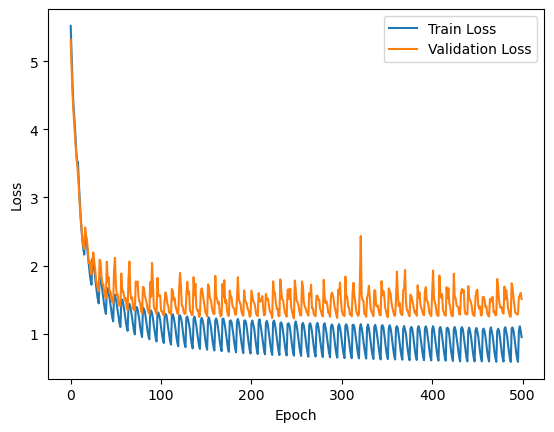

In [16]:
print(f"\nPlotting graph for Model : ")

plt.plot(train_losses, label='Train Loss')
plt.plot(val_losses, label='Validation Loss')
plt.xlabel('Epoch')
plt.ylabel('Loss')
plt.legend()
plt.show()

In [17]:
torch.save(saved_state,"best_model.pth")
torch.save(model.state_dict(),"model.pth")

In [19]:
print(f"Testing the Best Model on Validation Set: ")

test_loss = 0.0
test_acc = 0.0

model = Model(num_embed = 4, d_model=176, max_len=135, n_heads=4, num_encoders=2, num_classes=250, 
              dropout=0.11073790254354612, activation='relu', batch_first=True).to(device)
model.load_state_dict(saved_state)
loss_fn = nn.CrossEntropyLoss()

with torch.no_grad():
    
    for data, labels in val_loader:
        outputs = model(data)
        loss = loss_fn(outputs, labels)
        test_loss +=loss.item()
        _,gt = torch.max(outputs,1)
        test_acc += torch.sum(labels==gt)

    test_loss = test_loss/(len(val_loader)*128)
    test_acc = test_acc/(len(val_loader)*128)


    print(f'\tTest Loss: {test_loss:.4f}, Test Accuracy: {test_acc:.4f}')

Testing the Best Model on Validation Set: 
	Test Loss: 0.0118, Test Accuracy: 0.6473


In [20]:
def get_mean_classification_accuracy(dataloader):
    
    acc=[]
    with torch.no_grad():
        
        batch = 0
        mean_acc = 0.0
        for data, labels in dataloader:
            
            correct_preds = 0
            total_preds = 0
            
            batch = batch + 1
            outputs = model(data)
            loss = loss_fn(outputs, labels)
            _, preds = torch.max(outputs,1)
            correct_preds = correct_preds + torch.sum(preds==labels.data)
            total_preds = labels.size(0)
            acc.append(correct_preds/total_preds)
        mean_acc = torch.mean(torch.tensor(acc))
        return mean_acc
mean_acc_on_val_set = get_mean_classification_accuracy(val_loader)
mean_acc_on_train_set = get_mean_classification_accuracy(train_loader)

print(f'Mean Classification Accuracy on Train Set: {100*mean_acc_on_train_set:.4f}')
print(f'Mean Classification Accuracy on Validation Set: {100*mean_acc_on_val_set:.4f}')


Mean Classification Accuracy on Train Set: 75.8956
Mean Classification Accuracy on Validation Set: 64.5116


In [21]:
def get_mean_per_class_accuracy(dataloader):
    with torch.no_grad():
        class_acc = [[] for i in range(250)]
        
        num_classes = 250
        class_correct = [0] * num_classes
        class_total = [0] * num_classes
        for data, labels in dataloader:
            outputs = model(data)
            _, predicted = torch.max(outputs, 1)
            c = (predicted == labels).squeeze()
            for i in range(len(labels)):
                label = labels[i]
                class_correct[label] += c[i].item()
                class_total[label] += 1
            for i in range(num_classes):
                if class_total[i]==0:
                    class_acc[i].append(0)
                else:
                    class_acc[i].append(class_correct[i]/class_total[i])
        mean_per_class_acc_list = [torch.mean(torch.tensor(class_acc[i])) for i in range(len(class_acc))]
        return mean_per_class_acc_list
    
import json
def read_json(path):
    with open(path, "r") as file:
        json_data = json.load(file)
    return json_data

s2p_map = read_json(os.path.join("/kaggle/input/class-label-json/sign_to_prediction_index_map.json"))
p2s_map = {v: k for k, v in s2p_map.items()}

encoder = lambda x: s2p_map.get(x)
decoder = lambda x: p2s_map.get(x)


print('Mean per class accuracies for the train set: ')
train_mean_per_class_acc = get_mean_per_class_accuracy(train_loader)
for i in range(len(train_mean_per_class_acc)):
    print(f'{p2s_map[i]}: {100*train_mean_per_class_acc[i]:.4f}')
    
print('Mean per class accuracies for the validation set: ')
val_mean_per_class_acc = get_mean_per_class_accuracy(val_loader)
for i in range(len(val_mean_per_class_acc)):
    print(f'{p2s_map[i]}: {100*val_mean_per_class_acc[i]:.4f}')

Mean per class accuracies for the train set: 
TV: 79.7626
after: 77.1372
airplane: 79.3714
all: 73.1099
alligator: 85.7380
animal: 63.5890
another: 83.8016
any: 68.6335
apple: 81.2476
arm: 71.8643
aunt: 83.7420
awake: 25.7596
backyard: 82.6858
bad: 68.9521
balloon: 78.6979
bath: 70.5308
because: 84.1114
bed: 81.2830
bedroom: 72.2554
bee: 76.0709
before: 65.8550
beside: 68.0045
better: 87.3155
bird: 83.5222
black: 85.8448
blow: 86.2757
blue: 76.6617
boat: 77.9545
book: 67.1105
boy: 89.2513
brother: 87.5508
brown: 85.1251
bug: 93.9234
bye: 81.0008
callonphone: 90.0864
can: 53.7172
car: 79.2199
carrot: 81.4977
cat: 76.0013
cereal: 78.0360
chair: 53.7589
cheek: 72.5005
child: 68.7703
chin: 50.9917
chocolate: 78.1734
clean: 66.0207
close: 60.4729
closet: 79.8819
cloud: 67.9897
clown: 87.9945
cow: 80.8109
cowboy: 81.2485
cry: 78.9766
cut: 70.8324
cute: 88.1310
dad: 80.9478
dance: 73.8407
dirty: 80.4622
dog: 70.1918
doll: 82.4909
donkey: 70.1920
down: 76.6267
drawer: 87.1791
drink: 83.3671
dr

In [22]:
from sklearn.metrics import confusion_matrix
import seaborn as sn
import pandas as pd

y_pred = []
y_true = []

# iterate over test data
for inputs, labels in val_loader:
        output = model(inputs) # Feed Network

        output = (torch.max(torch.exp(output), 1)[1]).data.cpu().numpy()
        y_pred.extend(output) # Save Prediction
        
        labels = labels.data.cpu().numpy()
        y_true.extend(labels) # Save Truth

# constant for classes


# Build confusion matrix
cf_matrix = confusion_matrix(y_true, y_pred)
df_cm = pd.DataFrame(cf_matrix / np.sum(cf_matrix, axis=1)[:, None], index = [v for k,v in p2s_map.items()],
                     columns = [v for k,v in p2s_map.items()])
plt.figure(figsize = (250,250))
sn.heatmap(df_cm, annot=True)
plt.savefig('output.png')

Run the above cell to download the confusion matrix to zoom in and analyse

# Training with params obtained from hyperparameter tuning above:
Params: 
*     num_embed_layers: 2
*     n_heads: 11
*     n_encoder_layers: 4
*     dropout: 0.31891239569219343

In [ ]:
model = Model(num_embed = 2, d_model=176, max_len=135, n_heads=11, num_encoders=4, num_classes=250, 
              dropout=0.31891239569219343, activation='relu', batch_first=True).to(device)

learning_rate = 5e-4
weight_decay = 1e-1
cycle = 8

loss_fn = nn.CrossEntropyLoss()
optimizer = torch.optim.AdamW(model.parameters(), lr=learning_rate, weight_decay=weight_decay)
scheduler = torch.optim.lr_scheduler.CosineAnnealingWarmRestarts(optimizer, T_0=cycle, eta_min=learning_rate / 10)

train_losses = []
val_losses = []

def train_val_loop(epoch, train_dataloader, val_dataloader, model, loss_fn, optimizer, scheduler, n_offset=1):
    total_batches = len(train_dataloader)
    train_size, train_batches = 0, 0
    train_loss, train_correct = 0, 0
    val_size, val_batches = 0, 0
    val_loss, val_correct = 0, 0
    
    with tqdm(desc=f'Epoch {epoch+n_offset}', total=total_batches) as bar:
        
        # Training
        for batch, (src, y) in enumerate(train_dataloader):
            
            # Compute prediction and loss
            pred = model(src)
            loss = loss_fn(pred, y)
            
            # Compute metrics
            train_loss += loss.item()
            train_correct += (pred.argmax(1) == y).type(torch.float).sum().item()
            train_size += len(y)
            train_batches += 1

            # Backpropagation
            optimizer.zero_grad()
            loss.backward()
            torch.nn.utils.clip_grad_norm_(model.parameters(), 0.5)
            optimizer.step()
                
            scheduler.step(epoch + batch / total_batches)
            
            # Update progress bar
            bar.update()
            bar.set_postfix(accuracy = train_correct / train_size, loss = train_loss / train_batches,
                           lr=scheduler.get_last_lr())
            
        bar.set_postfix(accuracy = train_correct / train_size, loss = train_loss / train_batches)
        
        #scheduler.step()
           
        # Validation
        with torch.no_grad():

            for batch, (src, y) in enumerate(val_dataloader):
                
                # Compute prediction and loss
                pred = model(src)
                val_loss += loss_fn(pred, y).item()
                
                # Compute metrics
                val_correct += (pred.argmax(1) == y).type(torch.float).sum().item()
                val_size += len(y)
                val_batches += 1

                # Update progress bar
                bar.set_postfix(
                    accuracy = train_correct / train_size, loss = train_loss / train_batches,
                    val_accuracy = val_correct / val_size, val_loss = val_loss / val_batches
                )
                
    if scheduler.T_0 - scheduler.T_cur < 0.1:
        print()
        
    train_losses.append(train_loss / train_batches)
    val_losses.append(val_loss / val_batches)

    return train_correct / train_size, train_loss / train_batches, val_correct / val_size, val_loss / val_batches


best_loss = float('inf')
saved_state = model.state_dict()

epochs = 300
for epoch in range(epochs):
    acc, loss, v_acc, v_loss = train_val_loop(epoch, train_loader, val_loader, model, loss_fn, optimizer, scheduler)
    if v_loss<best_loss:
        best_loss = v_loss
        saved_state = model.state_dict()

torch.save(saved_state,"best_model_final.pth")
torch.save(model.state_dict,"model_final.pth")



Epoch 8: 100%|██████████| 665/665 [00:52<00:00, 12.77it/s, accuracy=0.152, loss=3.94, val_accuracy=0.158, val_loss=3.91]


Epoch 16: 100%|██████████| 665/665 [00:52<00:00, 12.78it/s, accuracy=0.431, loss=2.42, val_accuracy=0.423, val_loss=2.49]


Epoch 24: 100%|██████████| 665/665 [00:52<00:00, 12.78it/s, accuracy=0.561, loss=1.83, val_accuracy=0.54, val_loss=1.96] 


Epoch 32: 100%|██████████| 665/665 [00:52<00:00, 12.77it/s, accuracy=0.628, loss=1.54, val_accuracy=0.596, val_loss=1.7] 


Epoch 40: 100%|██████████| 665/665 [00:52<00:00, 12.78it/s, accuracy=0.666, loss=1.37, val_accuracy=0.618, val_loss=1.59]


Epoch 48: 100%|██████████| 665/665 [00:52<00:00, 12.77it/s, accuracy=0.692, loss=1.26, val_accuracy=0.64, val_loss=1.51] 


Epoch 56: 100%|██████████| 665/665 [00:52<00:00, 12.79it/s, accuracy=0.712, loss=1.18, val_accuracy=0.65, val_loss=1.46] 


Epoch 64: 100%|██████████| 665/665 [00:52<00:00, 12.76it/s, accuracy=0.727, loss=1.12, val_accuracy=0.658, val_loss=1.42]


Epoch 72: 100%|██████████| 665/665 [00:52<00:00, 12.78it/s, accuracy=0.74, loss=1.07, val_accuracy=0.672, val_loss=1.38]


Epoch 80: 100%|██████████| 665/665 [00:52<00:00, 12.74it/s, accuracy=0.751, loss=1.03, val_accuracy=0.675, val_loss=1.37]


Epoch 88: 100%|██████████| 665/665 [00:52<00:00, 12.78it/s, accuracy=0.758, loss=0.991, val_accuracy=0.671, val_loss=1.38]


Epoch 96: 100%|██████████| 665/665 [00:52<00:00, 12.78it/s, accuracy=0.766, loss=0.963, val_accuracy=0.681, val_loss=1.35]


Epoch 104: 100%|██████████| 665/665 [00:52<00:00, 12.76it/s, accuracy=0.77, loss=0.941, val_accuracy=0.683, val_loss=1.35]


Epoch 112: 100%|██████████| 665/665 [00:52<00:00, 12.77it/s, accuracy=0.774, loss=0.92, val_accuracy=0.68, val_loss=1.37] 


Epoch 120: 100%|██████████| 665/665 [00:52<00:00, 12.78it/s, accuracy=0.78, loss=0.896, val_accuracy=0.689, val_loss=1.34]


Epoch 128: 100%|██████████| 665/665 [00:52<00:00, 12.78it/s, accuracy=0.787, loss=0.877, val_accuracy=0.685, val_loss=1.36]


Epoch 136: 100%|██████████| 665/665 [00:52<00:00, 12.78it/s, accuracy=0.791, loss=0.862, val_accuracy=0.689, val_loss=1.35]


Epoch 144: 100%|██████████| 665/665 [00:52<00:00, 12.76it/s, accuracy=0.792, loss=0.848, val_accuracy=0.69, val_loss=1.33] 


Epoch 152: 100%|██████████| 665/665 [00:52<00:00, 12.78it/s, accuracy=0.799, loss=0.831, val_accuracy=0.687, val_loss=1.37]


Epoch 160: 100%|██████████| 665/665 [00:52<00:00, 12.78it/s, accuracy=0.8, loss=0.82, val_accuracy=0.694, val_loss=1.35]


Epoch 168: 100%|██████████| 665/665 [00:52<00:00, 12.78it/s, accuracy=0.803, loss=0.808, val_accuracy=0.689, val_loss=1.36]


Epoch 176: 100%|██████████| 665/665 [00:52<00:00, 12.78it/s, accuracy=0.808, loss=0.795, val_accuracy=0.688, val_loss=1.35]


Epoch 184: 100%|██████████| 665/665 [00:52<00:00, 12.74it/s, accuracy=0.81, loss=0.782, val_accuracy=0.686, val_loss=1.36]


Epoch 192: 100%|██████████| 665/665 [00:52<00:00, 12.77it/s, accuracy=0.812, loss=0.774, val_accuracy=0.692, val_loss=1.36]


Epoch 200: 100%|██████████| 665/665 [00:52<00:00, 12.78it/s, accuracy=0.814, loss=0.765, val_accuracy=0.691, val_loss=1.36]


Epoch 208: 100%|██████████| 665/665 [00:52<00:00, 12.78it/s, accuracy=0.816, loss=0.757, val_accuracy=0.694, val_loss=1.36]


Epoch 216: 100%|██████████| 665/665 [00:52<00:00, 12.78it/s, accuracy=0.82, loss=0.744, val_accuracy=0.693, val_loss=1.36]


Epoch 224: 100%|██████████| 665/665 [00:52<00:00, 12.73it/s, accuracy=0.82, loss=0.739, val_accuracy=0.696, val_loss=1.38]


Epoch 232: 100%|██████████| 665/665 [00:52<00:00, 12.78it/s, accuracy=0.822, loss=0.731, val_accuracy=0.694, val_loss=1.36]


Epoch 248: 100%|██████████| 665/665 [00:52<00:00, 12.79it/s, accuracy=0.827, loss=0.716, val_accuracy=0.696, val_loss=1.37]


Epoch 256: 100%|██████████| 665/665 [00:52<00:00, 12.78it/s, accuracy=0.828, loss=0.708, val_accuracy=0.698, val_loss=1.37]


Epoch 264: 100%|██████████| 665/665 [00:52<00:00, 12.75it/s, accuracy=0.83, loss=0.704, val_accuracy=0.695, val_loss=1.37]


Epoch 272: 100%|██████████| 665/665 [00:52<00:00, 12.77it/s, accuracy=0.833, loss=0.697, val_accuracy=0.702, val_loss=1.36]


Epoch 276:  97%|█████████▋| 646/665 [00:48<00:01, 13.27it/s, accuracy=0.738, loss=1.02, lr=[0.00027765730042911307]]

In [ ]:
torch.save(saved_state,"best_model_final.pth")
torch.save(model.state_dict,"model_final.pth")

In [31]:
print(f"Testing the Best Model on Validation Set: ")

test_loss = 0.0
test_acc = 0.0

model = Model(num_embed = 4, d_model=176, max_len=135, n_heads=4, num_encoders=2, num_classes=250, 
              dropout=0.11073790254354612, activation='relu', batch_first=True).to(device)
model.load_state_dict(torch.load("/kaggle/input/saved-models/best_model_4_4_2_0p1.pth"))
loss_fn = nn.CrossEntropyLoss()

with torch.no_grad():
    
    for data, labels in val_loader:
        outputs = model(data)
        loss = loss_fn(outputs, labels)
        test_loss +=loss.item()
        _,gt = torch.max(outputs,1)
        test_acc += torch.sum(labels==gt)

    test_loss = test_loss/(len(val_loader)*128)
    test_acc = test_acc/(len(val_loader)*128)


    print(f'\tTest Loss: {test_loss:.4f}, Test Accuracy: {test_acc:.4f}')

Testing the Best Model on Validation Set: 
	Test Loss: 0.0125, Test Accuracy: 0.6249


In [38]:
def get_mean_classification_accuracy(dataloader):
    
    acc=[]
    with torch.no_grad():
        
        batch = 0
        mean_acc = 0.0
        for data, labels in dataloader:
            
            correct_preds = 0
            total_preds = 0
            
            batch = batch + 1
            outputs = model(data)
            loss = loss_fn(outputs, labels)
            _, preds = torch.max(outputs,1)
            correct_preds = correct_preds + torch.sum(preds==labels.data)
            total_preds = labels.size(0)
            acc.append(correct_preds/total_preds)
        mean_acc = torch.mean(torch.tensor(acc))
        return mean_acc

In [39]:
mean_acc_on_val_set = get_mean_classification_accuracy(val_loader)
mean_acc_on_train_set = get_mean_classification_accuracy(train_loader)

print(f'Mean Classification Accuracy on Train Set: {100*mean_acc_on_train_set:.4f}')
print(f'Mean Classification Accuracy on Validation Set: {100*mean_acc_on_val_set:.4f}')


Mean Classification Accuracy on Train Set: 72.8189
Mean Classification Accuracy on Validation Set: 62.7274


In [48]:
def get_mean_per_class_accuracy(dataloader):
    with torch.no_grad():
        class_acc = [[] for i in range(250)]
        
        num_classes = 250
        class_correct = [0] * num_classes
        class_total = [0] * num_classes
        for data, labels in dataloader:
            outputs = model(data)
            _, predicted = torch.max(outputs, 1)
            c = (predicted == labels).squeeze()
            for i in range(len(labels)):
                label = labels[i]
                class_correct[label] += c[i].item()
                class_total[label] += 1
            for i in range(num_classes):
                if class_total[i]==0:
                    class_acc[i].append(0)
                else:
                    class_acc[i].append(class_correct[i]/class_total[i])
        mean_per_class_acc_list = [torch.mean(torch.tensor(class_acc[i])) for i in range(len(class_acc))]
        return mean_per_class_acc_list

In [49]:
import json
def read_json(path):
    with open(path, "r") as file:
        json_data = json.load(file)
    return json_data

s2p_map = read_json(os.path.join("/kaggle/input/class-label-json/sign_to_prediction_index_map.json"))
p2s_map = {v: k for k, v in s2p_map.items()}

encoder = lambda x: s2p_map.get(x)
decoder = lambda x: p2s_map.get(x)


print('Mean per class accuracies for the train set: ')
train_mean_per_class_acc = get_mean_per_class_accuracy(train_loader)
for i in range(len(train_mean_per_class_acc)):
    print(f'{p2s_map[i]}: {100*train_mean_per_class_acc[i]:.4f}')
    
print('Mean per class accuracies for the validation set: ')
val_mean_per_class_acc = get_mean_per_class_accuracy(val_loader)
for i in range(len(val_mean_per_class_acc)):
    print(f'{p2s_map[i]}: {100*val_mean_per_class_acc[i]:.4f}')

Mean per class accuracies for the train set: 
TV: 82.2175
after: 66.2387
airplane: 83.1029
all: 79.3168
alligator: 75.0954
animal: 65.3998
another: 85.3311
any: 70.5253
apple: 78.9872
arm: 84.9369
aunt: 75.2718
awake: 75.5444
backyard: 75.5412
bad: 71.5928
balloon: 78.8275
bath: 69.1971
because: 82.0593
bed: 75.1891
bedroom: 70.3388
bee: 60.6062
before: 73.2849
beside: 59.4323
better: 79.5867
bird: 74.6598
black: 80.7105
blow: 81.3681
blue: 69.6409
boat: 67.2012
book: 74.6024
boy: 73.5987
brother: 71.3534
brown: 88.7110
bug: 89.9243
bye: 83.4949
callonphone: 67.9748
can: 75.1352
car: 72.0468
carrot: 75.0477
cat: 77.4166
cereal: 69.7964
chair: 77.6071
cheek: 57.8496
child: 77.7504
chin: 43.6197
chocolate: 90.2612
clean: 71.4337
close: 58.8643
closet: 87.7617
cloud: 67.8539
clown: 79.5988
cow: 77.7011
cowboy: 73.1045
cry: 63.4846
cut: 69.0317
cute: 83.8354
dad: 86.2595
dance: 53.3552
dirty: 79.1308
dog: 80.9461
doll: 82.6672
donkey: 83.5348
down: 74.6711
drawer: 59.2206
drink: 84.8566
dr

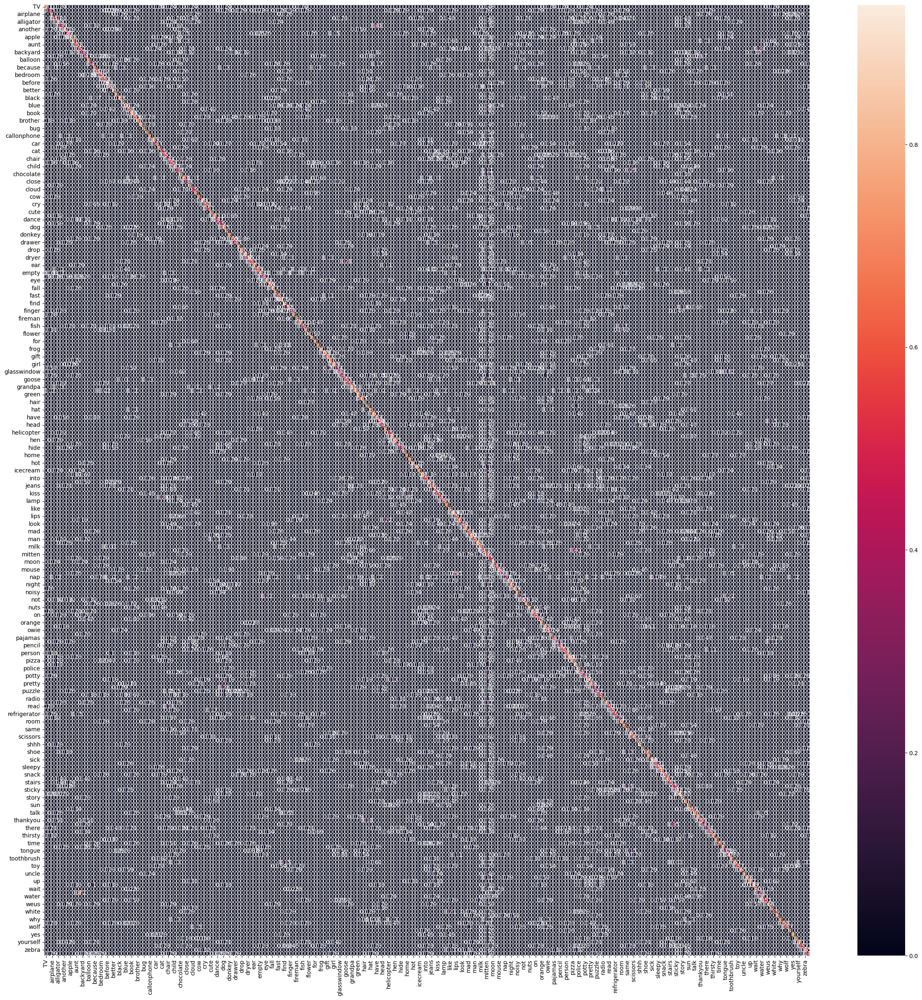

In [44]:
from sklearn.metrics import confusion_matrix
import seaborn as sn
import pandas as pd

y_pred = []
y_true = []

# iterate over test data
for inputs, labels in val_loader:
        output = model(inputs) # Feed Network

        output = (torch.max(torch.exp(output), 1)[1]).data.cpu().numpy()
        y_pred.extend(output) # Save Prediction
        
        labels = labels.data.cpu().numpy()
        y_true.extend(labels) # Save Truth

# constant for classes


# Build confusion matrix
cf_matrix = confusion_matrix(y_true, y_pred)
df_cm = pd.DataFrame(cf_matrix / np.sum(cf_matrix, axis=1)[:, None], index = [v for k,v in p2s_map.items()],
                     columns = [v for k,v in p2s_map.items()])
plt.figure(figsize = (30,30))
sn.heatmap(df_cm, annot=True)
plt.savefig('output.png')

In [47]:
plt.figure(figsize = (250,250))
sn.heatmap(df_cm, annot=True)
plt.savefig('output1.png')